In [1]:
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import interp1d
from tqdm import tqdm

warnings.filterwarnings(action='ignore')

## 각 Tray 별 데이터 불러오기

In [2]:
df_dic = {} 
for idx, i in enumerate(range(1, 6)): # 1번부터 5번 TRAY 파일을 불러와서, dictionary에 저장
    df_name = 'df' + str(i)
    df = pd.read_csv(f"TRAY{i}_data_.csv", index_col=0)
    
    if idx == 0: basis_col = df.columns
    print(f"Unique sequence의 개수 (Tray {i}): {len(df['Sequence'].unique())}")
    print(df.shape, '\n')
    
    df_dic[df_name] = df[basis_col]
    
target_col = df.columns[3:]
print(df_dic.keys()) # key: TRAY 구분 (1~5), value: TRAY 별 csv 파일을 읽은 데이터프레임
print(target_col)

Unique sequence의 개수 (Tray 1): 999
(15110, 12) 

Unique sequence의 개수 (Tray 2): 1001
(13843, 15) 

Unique sequence의 개수 (Tray 3): 999
(14921, 12) 

Unique sequence의 개수 (Tray 4): 990
(14606, 12) 

Unique sequence의 개수 (Tray 5): 999
(13521, 12) 

dict_keys(['df1', 'df2', 'df3', 'df4', 'df5'])
Index(['Velocity_Q1', 'Velocity_Q2', 'Velocity_Q3', 'Torque_Q1', 'Torque_Q2',
       'Torque_Q3', 'Position_error_Q1', 'Position_error_Q2',
       'Position_error_Q3'],
      dtype='object')


## 각 Tray 별로 유의미한 데이터만 남기도록 Step 개수 줄이기 

In [3]:
max_step = 0
new_df_dic = {}
sequence_step_dic = {}
for tray in df_dic.keys():   
    ### 1. 모든 Sequence에서 가장 마지막 Step의 각 Columns에 대한 평균값 계산
    df = df_dic[tray]
    mean_df = pd.DataFrame(df.groupby('Sequence').max('Step')[target_col].mean()).T
    
    ### 2. 유의미한 데이터 자르기
    # 대부분의 Step에서 후반부에서 특이점이 발견되는 특징이 있음
    # 따라서, 유의미한 데이터를 추리기 위해 10번 (후반부) Step 일 때의 Position Error 값의 mean 값을 기준으로, Step을 자르기
    P_E_Q1 = df[df['Step'] == 10]['Position_error_Q1'].mean()
    P_E_Q2 = df[df['Step'] == 10]['Position_error_Q2'].mean()
    P_E_Q3 = df[df['Step'] == 10]['Position_error_Q3'].mean()
    
    curr_df = df[
        (df['Position_error_Q1'] <= P_E_Q1) & \
        (df['Position_error_Q2'] <= P_E_Q2) & \
        (df['Position_error_Q3'] >= P_E_Q3)
    ]
    
    # Sequence 별로 Step의 개수가 1부터 시작하도록 셋팅
    curr_df['Step'] = curr_df.groupby('Sequence').cumcount() + 1
    
    ### 3. Step의 개수가 한 개인 Sequence에는 1번에서 구한 mean_df를 추가해서 (Min) Step의 개수를 2로 맞추기
    sequence_step_df = curr_df.groupby('Sequence').count()['Step']
    only_one_step_sequence = sequence_step_df[sequence_step_df == 1].index
    
    # Step의 개수가 한 개인 Sequence에 대해서만 (모든 Sequence에서 가장 마지막 Step의) 평균값 데이터를 추가해주기
    for seq in only_one_step_sequence: 
        target_mean_df = mean_df.copy()
        target_mean_df.insert(0, 'Time', np.nan)
        target_mean_df.insert(1, 'Sequence', seq)
        target_mean_df.insert(2, 'Step', 2)
        
        curr_df = pd.concat([curr_df, target_mean_df])
    
    curr_df = curr_df.sort_values(['Sequence', 'Step']).reset_index(drop=True)
    new_df_dic[tray] = curr_df # key: TRAY 구분 (1~5), value: TRAY 안에서 유의미한 Step 데이터만 남은 데이터프레임
    
    print(f"{tray}: {curr_df.shape}")
    print(f"Unique sequence의 개수: {len(curr_df['Sequence'].unique())}")
    
    ### 4. 잘라진 데이터 안에서 Sequence 별로 Step 개수 확인하기
    # 각 Sequence 별로 Step의 개수가 몇 개씩 존재하는지 확인
    curr_group_df = curr_df.groupby('Sequence').count()[['Step']]
    print(curr_group_df.value_counts('Step').sort_index())
    
    # 모든 Tray 안에서 가장 많은 Step의 개수를 확인하여, max_step 이라는 변수에 할당
    if max_step < curr_group_df['Step'].max():
        max_step = curr_group_df['Step'].max()
        
    # dictionary of dictionary type을 보이고 있음
    '''
    {1번 TRAY: {Unique 한 Step의 개수: 해당 Step이 속해있는 Sequence의 번호}, 
     2번 TRAY: {Unique 한 Step의 개수: 해당 Step이 속해있는 Sequence의 번호},
     3번 TRAY: {Unique 한 Step의 개수: 해당 Step이 속해있는 Sequence의 번호},
     4번 TRAY: {Unique 한 Step의 개수: 해당 Step이 속해있는 Sequence의 번호},
     5번 TRAY: {Unique 한 Step의 개수: 해당 Step이 속해있는 Sequence의 번호}}
    '''
    sequence_step_count = sorted(curr_group_df['Step'].unique())
    sequence_step_dic[tray] = {
        i: list(curr_group_df[curr_group_df['Step'] == i].index) \
        for i in sequence_step_count
    } 
    
    print(sequence_step_dic.keys(), '-', sequence_step_dic[tray].keys(), '\n')
        
print(new_df_dic.keys()) # key: TRAY 구분 (1~5), value: TRAY 안에서 유의미한 Step 데이터만 남은 데이터프레임

df1: (4989, 12)
Unique sequence의 개수: 985
Step
2     81
3     86
4    100
5    144
6    570
7      3
8      1
dtype: int64
dict_keys(['df1']) - dict_keys([2, 3, 4, 5, 6, 7, 8]) 

df2: (3670, 12)
Unique sequence의 개수: 970
Step
2    165
3     54
4    577
5    174
dtype: int64
dict_keys(['df1', 'df2']) - dict_keys([2, 3, 4, 5]) 

df3: (4774, 12)
Unique sequence의 개수: 937
Step
2    103
3     73
4     51
5    141
6    548
7     16
8      5
dtype: int64
dict_keys(['df1', 'df2', 'df3']) - dict_keys([2, 3, 4, 5, 6, 7, 8]) 

df4: (5061, 12)
Unique sequence의 개수: 956
Step
2     76
3    229
4     47
5     36
6    125
7    441
8      1
9      1
dtype: int64
dict_keys(['df1', 'df2', 'df3', 'df4']) - dict_keys([2, 3, 4, 5, 6, 7, 8, 9]) 

df5: (3518, 12)
Unique sequence의 개수: 887
Step
2    312
3    125
4     69
5     48
6    329
7      3
8      1
dtype: int64
dict_keys(['df1', 'df2', 'df3', 'df4', 'df5']) - dict_keys([2, 3, 4, 5, 6, 7, 8]) 

dict_keys(['df1', 'df2', 'df3', 'df4', 'df5'])


## 각 Tray 별로 보간법을 적용하기 전에, 각 Columns 별로 그래프 그려보기

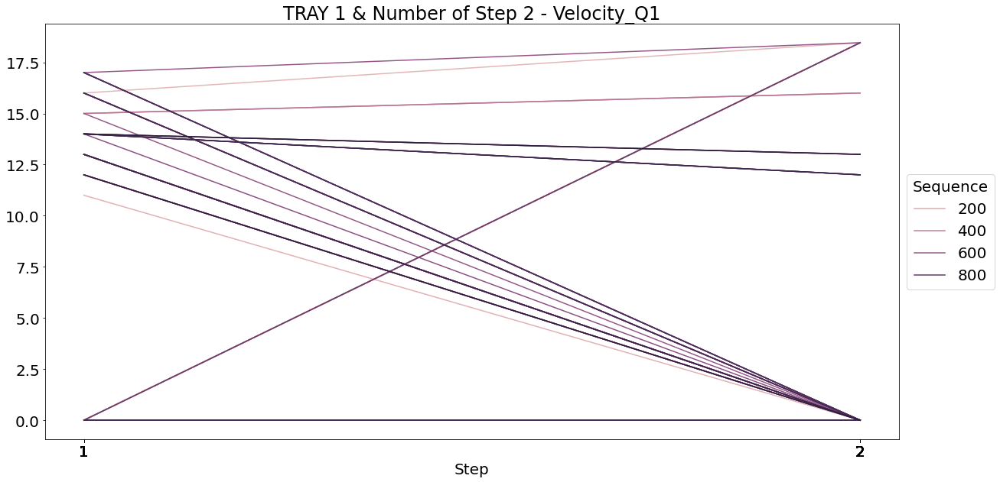

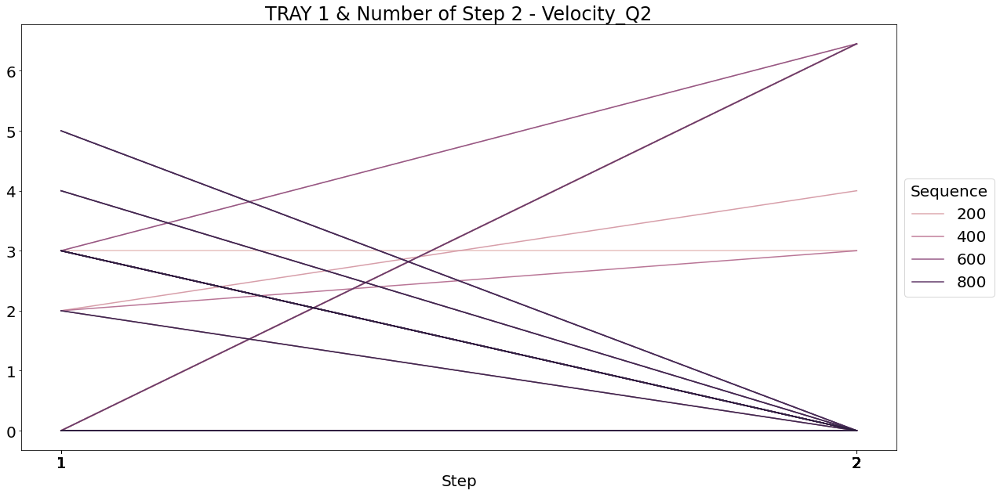

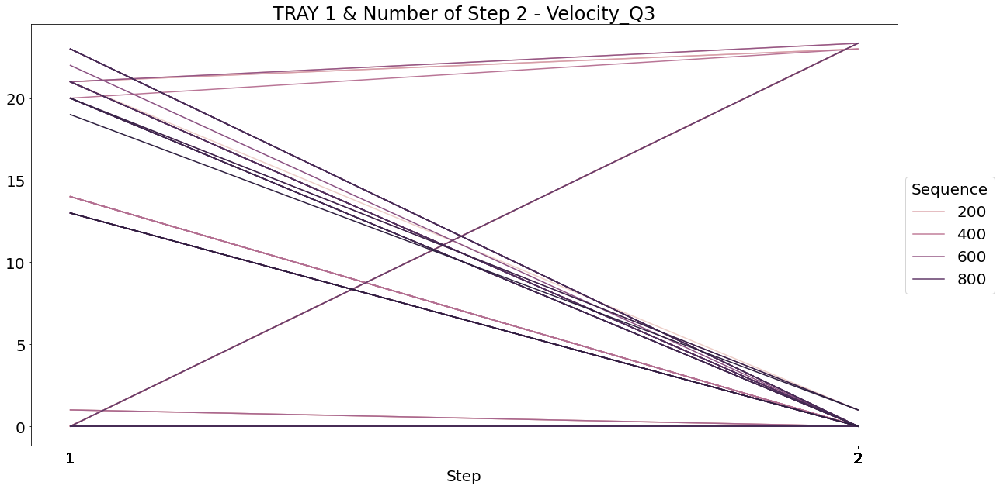

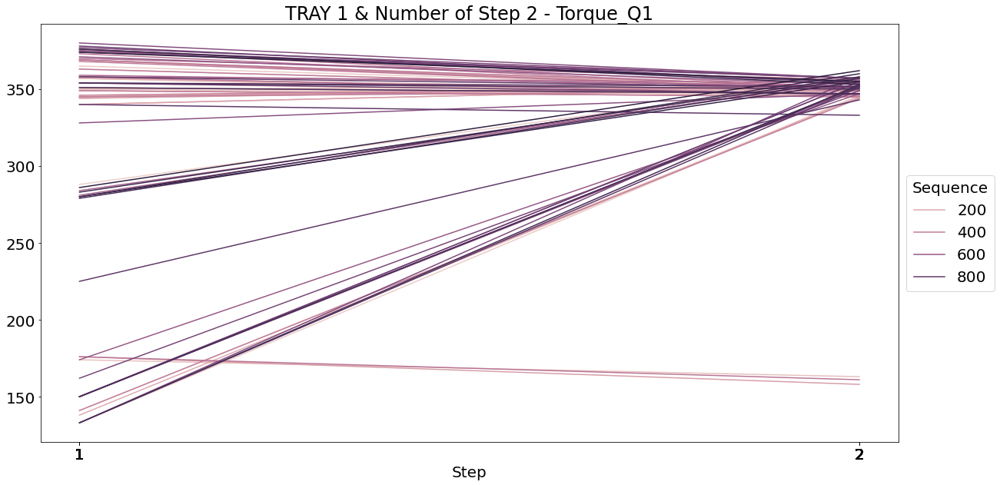

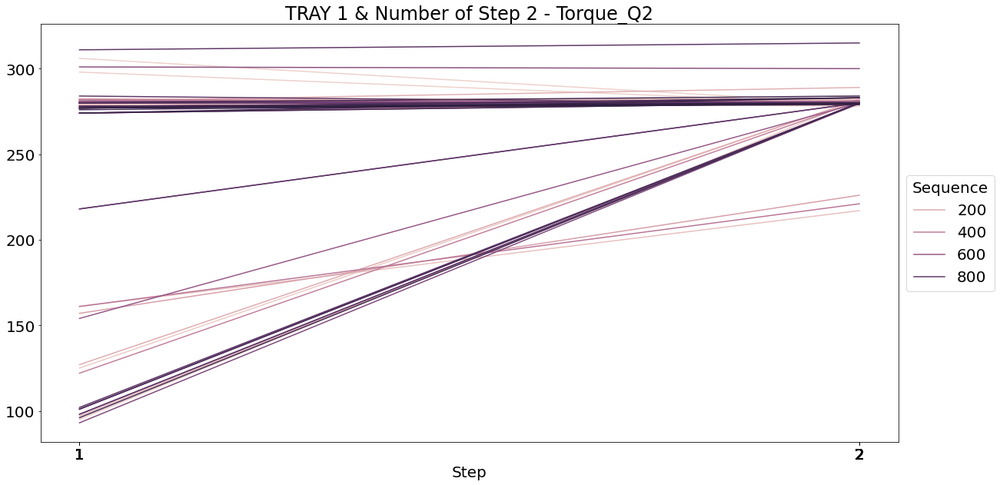

...

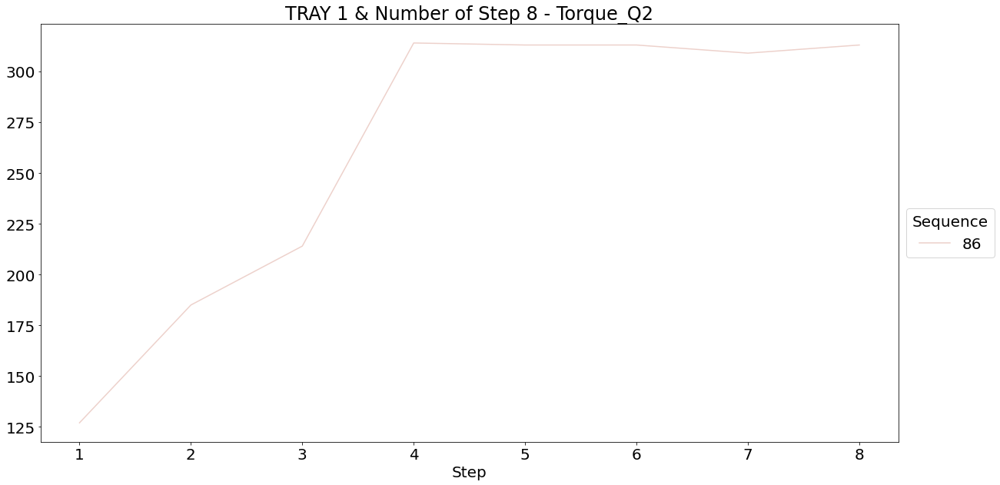

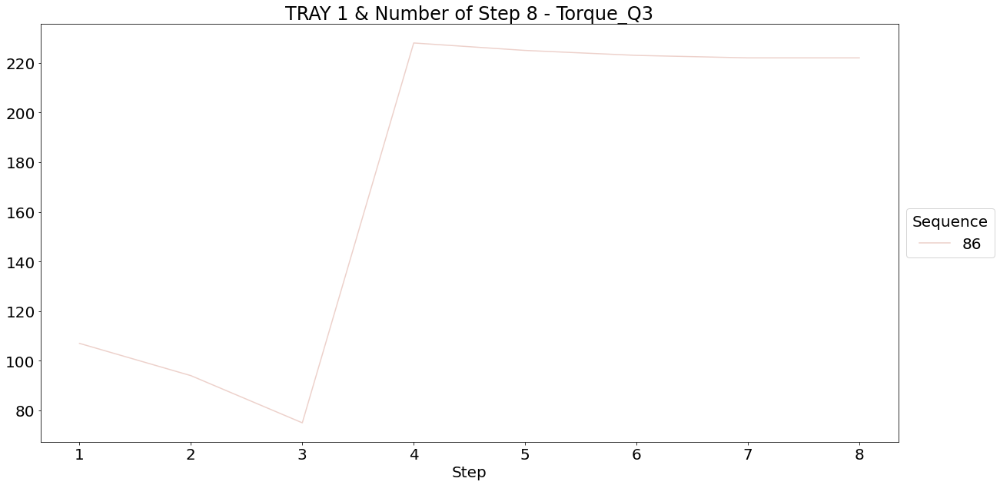

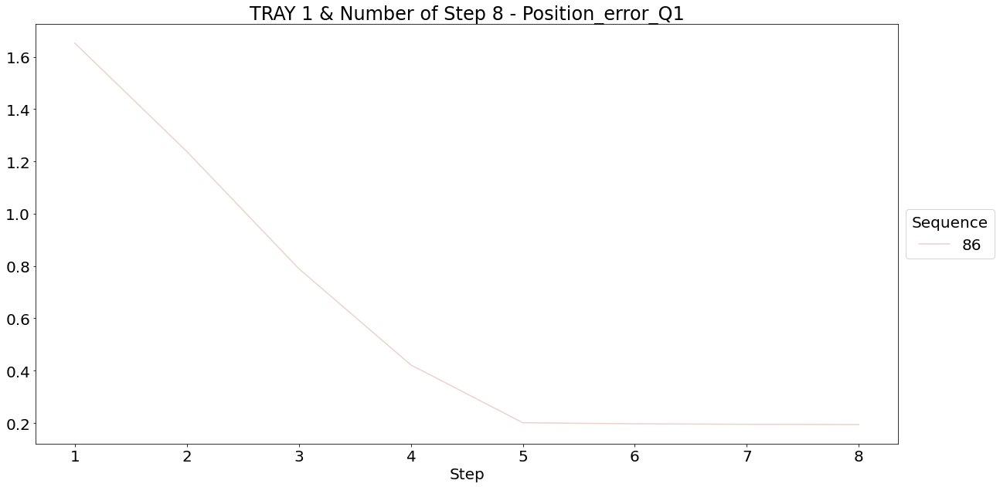

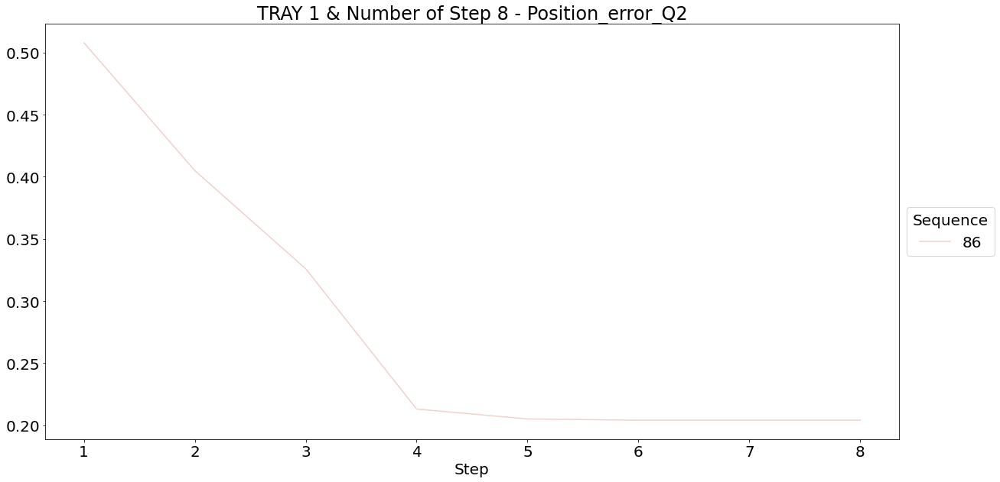

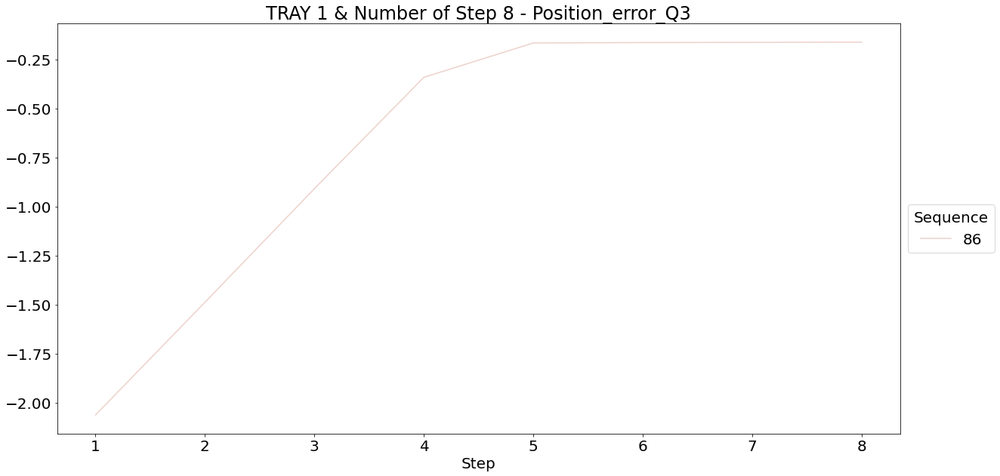

In [5]:
for tray in sequence_step_dic.keys():
    sequence_dic = sequence_step_dic[tray] # 해당 Tray의 Step 개수에 따른 Sequence를 가지고 있는 dictionary
    
    for step_num in sequence_dic.keys():
        total_df = new_df_dic[tray] # 해당 Tray 안에서, Step의 개수를 줄였던 데이터프레임 불러오기
        sequence_lst = sequence_dic[step_num]
        
        target_df = total_df[total_df['Sequence'].isin(sequence_lst)]
        for idx, col in enumerate(target_col):
            plt.rc('font', size=20)
            fig, ax = plt.subplots(figsize=(20, 10))
            sns.lineplot(x='Step', y=col, hue='Sequence', data=target_df)
            
            ax.set_ylabel('')
            ax.set_xticks(target_df['Step'])
            ax.set_title(f"TRAY {tray[-1]} & Number of Step {step_num} - {col}")
            ax.legend(title='Sequence', loc='center left', bbox_to_anchor=(1, 0.5))
            plt.show()
        print()
        
    break # 양이 너무 많기 때문에 TRAY 1에 대한 결과만 출력

## 모든 Tray에서 Step 개수의 최댓값 (max_step)으로, Sequence의 Step 개수 통일

In [6]:
max_step

9

In [7]:
final_df_dic = {}
for tray in tqdm(new_df_dic.keys()):
    dic = {}
    df = new_df_dic[tray]
    for seq in df['Sequence'].unique():
        ori_len = df[df['Sequence'] == seq].shape[0] # 특정 Sequence의 기존 Step의 길이
        x = np.linspace(0, 1, ori_len)       # 0부터 1까지 ori_len의 길이 만큼 분할해서 데이터 만들기
        x_new = np.linspace(0, 1, max_step)  # 0부터 1까지 max_step의 길이 만큼 분할해서 데이터 만들기
        
        dic[seq] = {i: [] for i in list(target_col)}
        for col in target_col: # Velocity_Q1 ~ Position_Error_Q3 까지 총 9가지의 Columns
            # mas_step 만큼 늘린 개수와 동일하게 주어진 데이터에 보간법 적용
            f = interp1d(x, df[df['Sequence'] == seq][col], kind='nearest') 
            dic[seq][col] += f(x_new).tolist()
    
    # 보간법이 적용된 데이터가 List 형태로 만들어졌으므로, 데이터프레임 형태로 변환
    total_df = pd.DataFrame()
    for key in dic.keys():
        dic_df = pd.DataFrame(dic[key]).reset_index()
        dic_df['Sequence'] = key
        total_df = pd.concat([total_df, dic_df], axis=0)
        
    total_df.rename(columns={'index':'Step'}, inplace=True)
    final_df = pd.concat([total_df['Sequence'], total_df.iloc[:, :-1]], axis=1)
    
    final_df_dic[tray] = final_df
    
print(final_df_dic.keys())

100%|█████████████████████████████████████████████| 5/5 [00:23<00:00,  4.64s/it]

dict_keys(['df1', 'df2', 'df3', 'df4', 'df5'])


In [8]:
for key in final_df_dic.keys():
    print(final_df_dic[key].value_counts('Step'), '\n')

Step
0    985
1    985
2    985
3    985
4    985
5    985
6    985
7    985
8    985
dtype: int64 

Step
0    970
1    970
2    970
3    970
4    970
5    970
6    970
7    970
8    970
dtype: int64 

Step
0    937
1    937
2    937
3    937
4    937
5    937
6    937
7    937
8    937
dtype: int64 

Step
0    956
1    956
2    956
3    956
4    956
5    956
6    956
7    956
8    956
dtype: int64 

Step
0    887
1    887
2    887
3    887
4    887
5    887
6    887
7    887
8    887
dtype: int64 



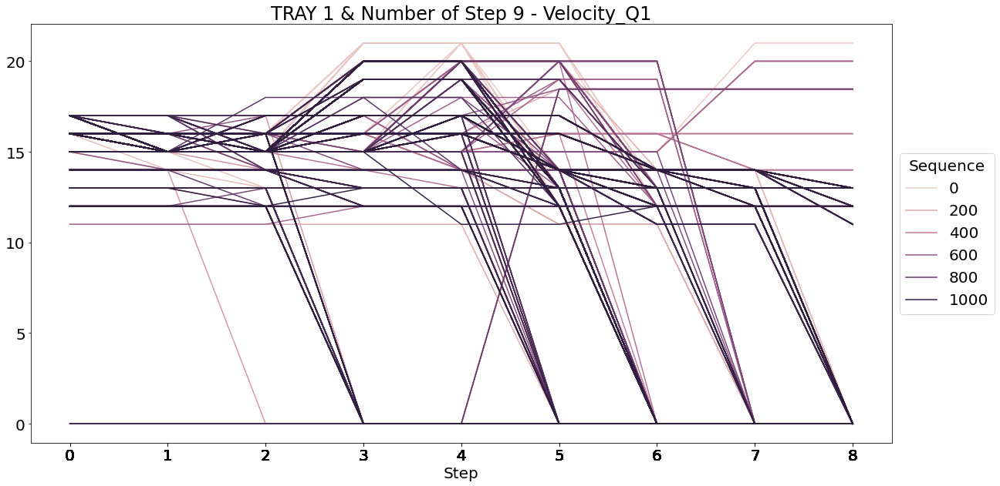

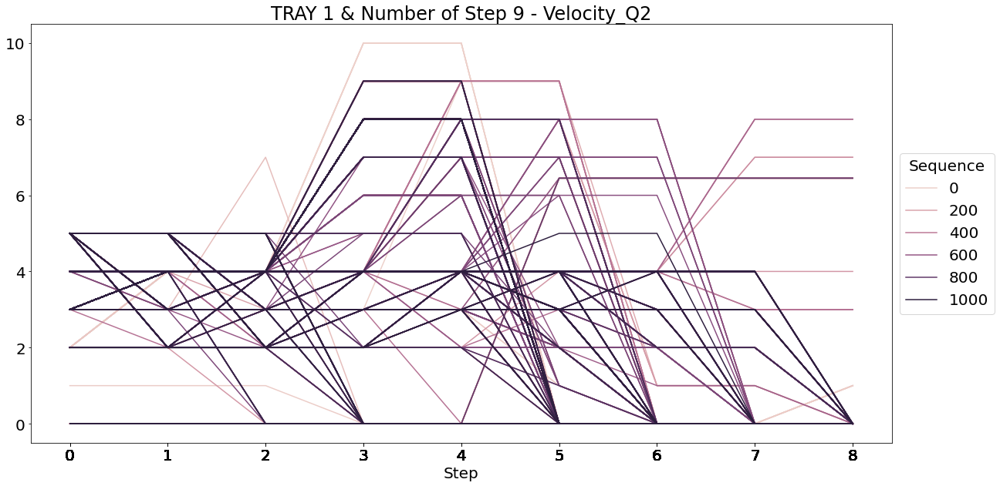

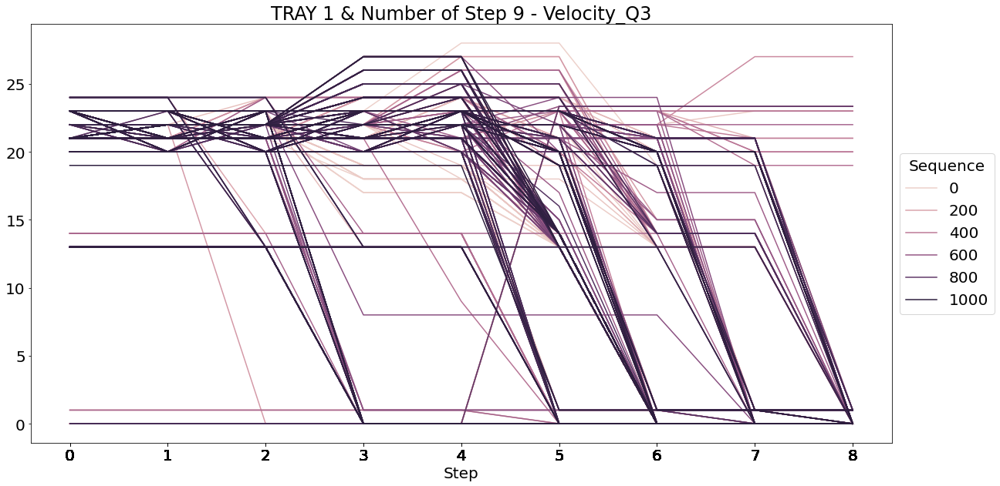

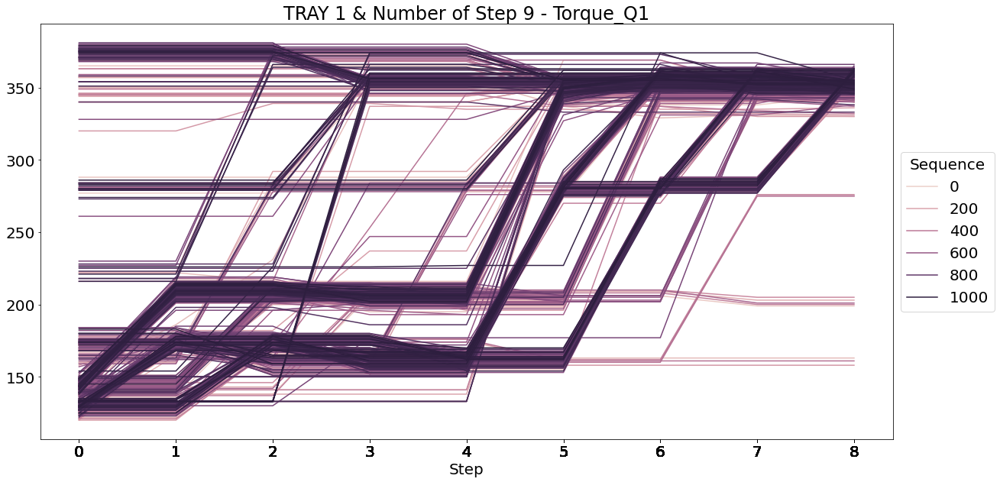

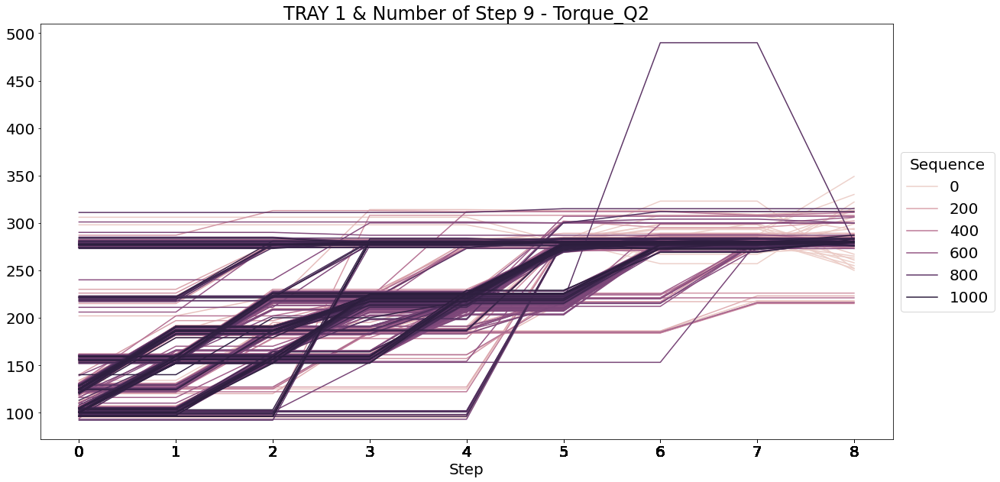

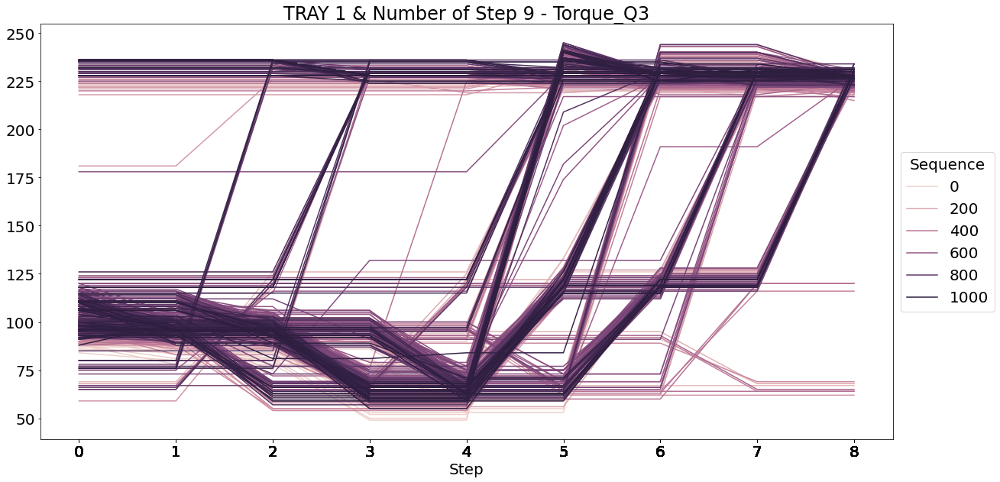

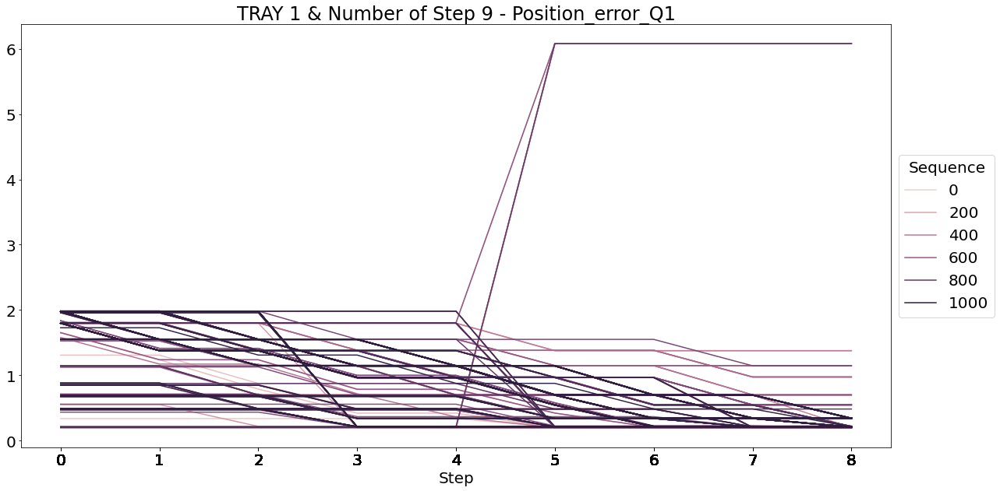

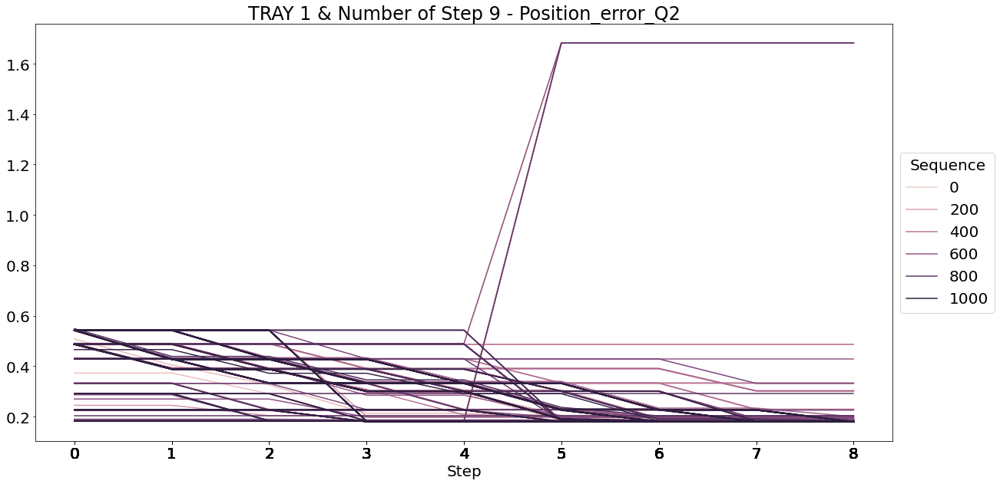

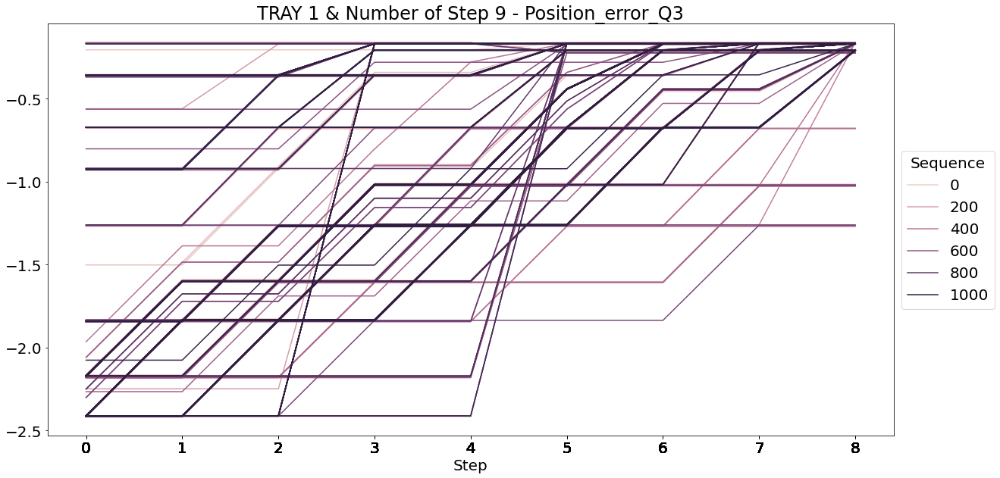

In [9]:
target_df = final_df_dic['df1']
for idx, col in enumerate(target_col):
    plt.rc('font', size=20)
    fig, ax = plt.subplots(figsize=(20, 10))
    sns.lineplot(x='Step', y=col, hue='Sequence', data=target_df)

    ax.set_ylabel('')
    ax.set_xticks(target_df['Step'])
    ax.set_title(f"TRAY 1 & Number of Step 9 - {col}")
    ax.legend(title='Sequence', loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

In [10]:
final_total_df = pd.DataFrame()
for tray in final_df_dic.keys():
    df = final_df_dic[tray]
    df['Tray'] = tray[-1]
    print(f"Shape of TRAY {tray[-1]}: {df.shape}")
    
    final_total_df = pd.concat([final_total_df, df], axis=0)
    
final_total_df = final_total_df.reset_index(drop=True)
final_total_df.sort_values(['Sequence', 'Step', 'Tray'])
print()
print(final_total_df.shape)
final_total_df.head()

Shape of TRAY 1: (8865, 12)
Shape of TRAY 2: (8730, 12)
Shape of TRAY 3: (8433, 12)
Shape of TRAY 4: (8604, 12)
Shape of TRAY 5: (7983, 12)

(42615, 12)


,Sequence,Step,Velocity_Q1,Velocity_Q2,Velocity_Q3,Torque_Q1,Torque_Q2,Torque_Q3,Position_error_Q1,Position_error_Q2,Position_error_Q3,Tray
0,0,0,16.0,2.0,21.0,147.0,134.0,95.0,1.800,0.489,-2.172,1
1,0,1,16.0,2.0,21.0,147.0,134.0,95.0,1.800,0.489,-2.172,1
2,0,2,15.0,3.0,23.0,208.0,191.0,72.0,1.386,0.392,-1.605,1
3,0,3,15.0,3.0,23.0,208.0,191.0,72.0,1.386,0.392,-1.605,1
4,0,4,21.0,9.0,28.0,202.0,209.0,60.0,0.980,0.306,-1.022,1


In [11]:
final_total_df.value_counts('Step')

Step
0    4735
1    4735
2    4735
3    4735
4    4735
5    4735
6    4735
7    4735
8    4735
dtype: int64

In [12]:
final_total_df.to_csv('final_data.csv')